<a href="https://colab.research.google.com/github/chl-eo/CCADMACL_EXAM_COM222ML/blob/main/Midterm_Exam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [159]:
import numpy as np
import pandas as pd
import seaborn as sns

from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from mpl_toolkits.mplot3d import Axes3D

from collections import Counter

In [160]:
face_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/face.csv?raw=true")
chrome_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/chrome.csv?raw=true")
lines2_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/lines2.csv?raw=true")
supernova_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/supernova.csv?raw=true")
network_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/network.csv?raw=true")
spirals_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/spirals.csv?raw=true")
densedisk_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/densedisk.csv?raw=true")
rings_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/rings.csv?raw=true")
chainlink_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/chainlink.csv?raw=true")


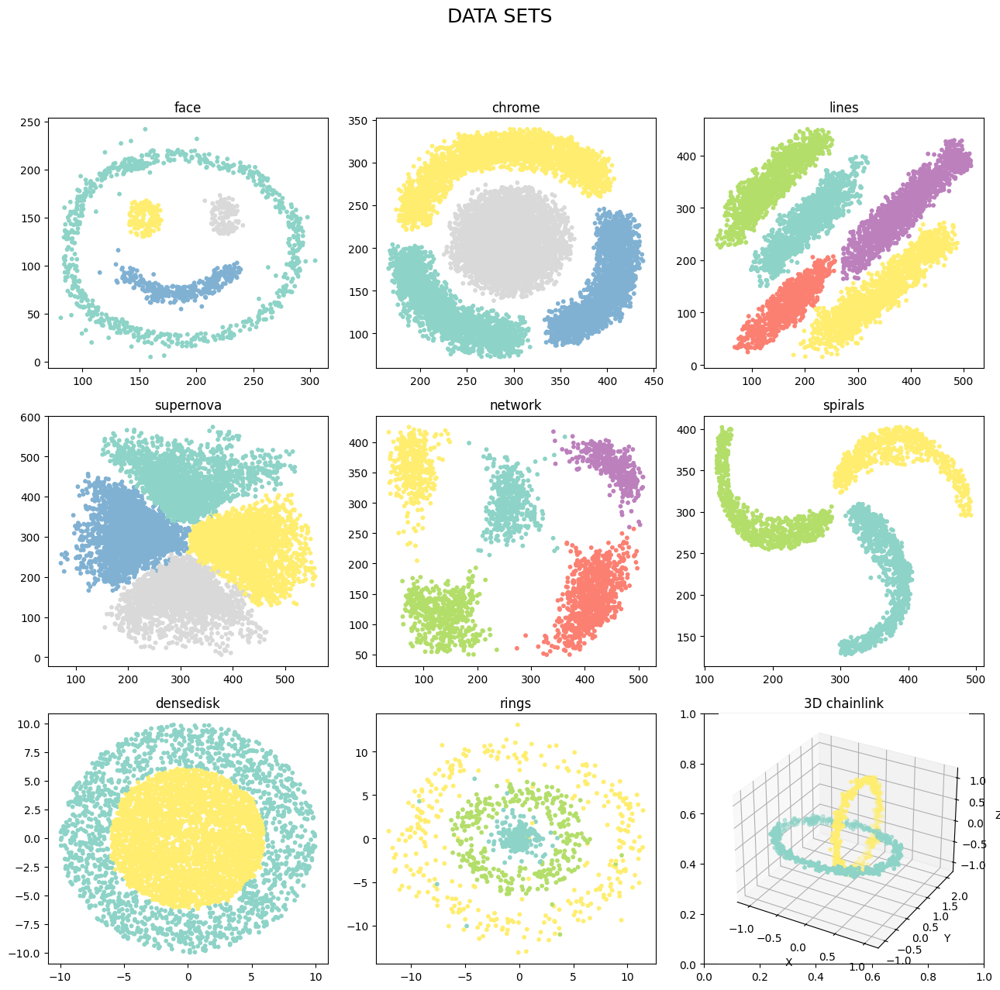

In [161]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(13, 13))
fig.suptitle('DATA SETS\n', size=18)

# Plot the 2D scatterplots
axes[0, 0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
axes[0, 0].set_title("face")

axes[0, 1].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
axes[0, 1].set_title("chrome")

axes[0, 2].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
axes[0, 2].set_title("lines")

axes[1, 0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
axes[1, 0].set_title("supernova")

axes[1, 1].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
axes[1, 1].set_title("network")

axes[1, 2].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
axes[1, 2].set_title("spirals")

axes[2, 0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3")
axes[2, 0].set_title("densedisk")

axes[2, 1].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
axes[2, 1].set_title("rings")

# Add a 3D plot
ax3d = fig.add_subplot(3, 3, 9, projection='3d')
ax3d.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], cmap="Set3", s=10)
ax3d.set_title("3D chainlink")
ax3d.set_xlabel("X")
ax3d.set_ylabel("Y")
ax3d.set_zlabel("Z")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])


**A. Use K-means to cluster each dataset**



1. Create each copy of the dataset for k-means







In [162]:
df_face = face_df.copy()
df_chrome = chrome_df.copy()
df_lines2 = lines2_df.copy()
df_supernova = supernova_df.copy()
df_network = network_df.copy()
df_spirals = spirals_df.copy()
df_densedisk = densedisk_df.copy()
df_rings = rings_df.copy()
df_chainlink = chainlink_df.copy()

2. Drop the "color" column on all datasets

In [163]:
df_face.drop(columns=['color'], inplace=True)
df_chrome.drop(columns=['color'], inplace=True)
df_lines2.drop(columns=['color'], inplace=True)
df_supernova.drop(columns=['color'], inplace=True)
df_network.drop(columns=['color'], inplace=True)
df_spirals.drop(columns=['color'], inplace=True)
df_densedisk.drop(columns=['color'], inplace=True)
df_rings.drop(columns=['color'], inplace=True)
df_chainlink.drop(columns=['color'], inplace=True)

3. Train a K-means model for each dataset.


In [164]:
kmeans_face = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
kmeans_chrome = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
kmeans_lines2 = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
kmeans_supernova = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
kmeans_network = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
kmeans_spirals = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
kmeans_densedisk = KMeans(n_clusters = 2, init = 'k-means++', random_state = 42)
kmeans_rings = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
kmeans_chainlink = KMeans(n_clusters = 2, init = 'k-means++', random_state = 42)

y_kmeans_face = kmeans_face.fit_predict(df_face)
y_kmeans_chrome = kmeans_chrome.fit_predict(df_chrome)
y_kmeans_lines2 = kmeans_lines2.fit_predict(df_lines2)
y_kmeans_supernova = kmeans_supernova.fit_predict(df_supernova)
y_kmeans_network = kmeans_network.fit_predict(df_network)
y_kmeans_spirals = kmeans_spirals.fit_predict(df_spirals)
y_kmeans_densedisk = kmeans_densedisk.fit_predict(df_densedisk)
y_kmeans_rings = kmeans_rings.fit_predict(df_rings)
y_kmeans_chainlink = kmeans_chainlink.fit_predict(df_chainlink)

4. Add a "Cluster" column for each data set

In [165]:
df_face['Cluster'] = kmeans_face.fit_predict(df_face)
df_chrome['Cluster'] = kmeans_chrome.fit_predict(df_chrome)
df_lines2['Cluster'] = kmeans_lines2.fit_predict(df_lines2)
df_supernova['Cluster'] = kmeans_supernova.fit_predict(df_supernova)
df_network['Cluster'] = kmeans_network.fit_predict(df_network)
df_spirals['Cluster'] = kmeans_spirals.fit_predict(df_spirals)
df_densedisk['Cluster'] = kmeans_densedisk.fit_predict(df_densedisk)
df_rings['Cluster'] = kmeans_rings.fit_predict(df_rings)
df_chainlink['Cluster'] = kmeans_chainlink.fit_predict(df_chainlink)

5. Plot the Correct cluster and the K-means cluster

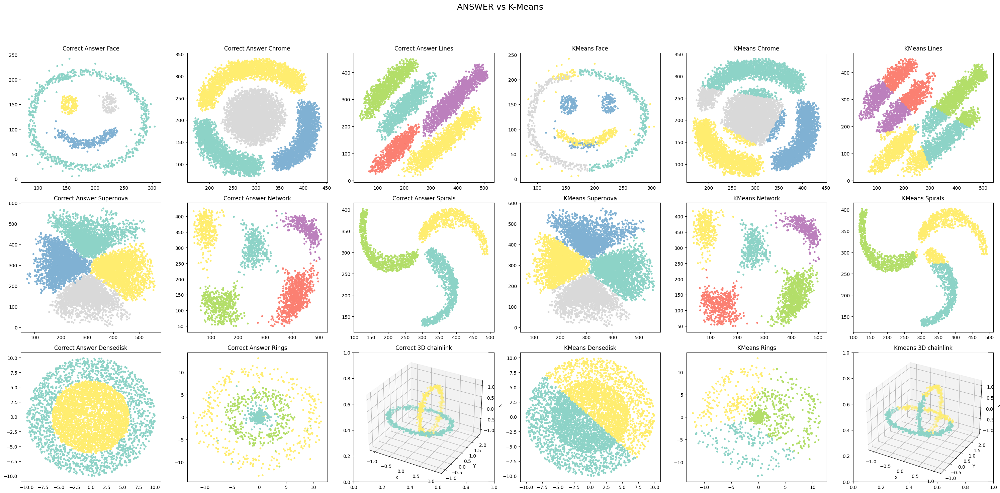

In [166]:
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(30, 15))
fig.suptitle('ANSWER vs K-Means\n', size = 18)

axes[0, 0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
axes[0, 0].set_title("Correct Answer Face")
axes[0, 3].scatter(df_face['x'], df_face['y'], c=df_face['Cluster'], s=10, cmap="Set3")
axes[0, 3].set_title("KMeans Face")

axes[0, 1].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
axes[0, 1].set_title("Correct Answer Chrome")
axes[0, 4].scatter(df_chrome['x'], df_chrome['y'], c=df_chrome['Cluster'], s=10, cmap="Set3")
axes[0, 4].set_title("KMeans Chrome")

axes[0, 2].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
axes[0, 2].set_title("Correct Answer Lines")
axes[0, 5].scatter(df_lines2['x'], df_lines2['y'], c=df_lines2['Cluster'], s=10, cmap="Set3")
axes[0, 5].set_title("KMeans Lines")

axes[1, 0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
axes[1, 0].set_title("Correct Answer Supernova")
axes[1, 3].scatter(df_supernova['x'], df_supernova['y'], c=df_supernova['Cluster'], s=10, cmap="Set3")
axes[1, 3].set_title("KMeans Supernova")

axes[1, 1].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
axes[1, 1].set_title("Correct Answer Network")
axes[1, 4].scatter(df_network['x'], df_network['y'], c=df_network['Cluster'], s=10, cmap="Set3")
axes[1, 4].set_title("KMeans Network")

axes[1, 2].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
axes[1, 2].set_title("Correct Answer Spirals")
axes[1, 5].scatter(df_spirals['x'], df_spirals['y'], c=df_spirals['Cluster'], s=10, cmap="Set3")
axes[1, 5].set_title("KMeans Spirals")

axes[2, 0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3")
axes[2, 0].set_title("Correct Answer Densedisk")
axes[2, 3].scatter(df_densedisk['x'], df_densedisk['y'], c=df_densedisk['Cluster'], s=10, cmap="Set3")
axes[2, 3].set_title("KMeans Densedisk")

axes[2, 1].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
axes[2, 1].set_title("Correct Answer Rings")
axes[2, 4].scatter(df_rings['x'], df_rings['y'], c=df_rings['Cluster'], s=10, cmap="Set3")
axes[2, 4].set_title("KMeans Rings")

ax3d = fig.add_subplot(3, 6, 15, projection='3d')
ax3d.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], cmap="Set3", s=10)
ax3d.set_title("Correct 3D chainlink")
ax3d.set_xlabel("X")
ax3d.set_ylabel("Y")
ax3d.set_zlabel("Z")

ax3d = fig.add_subplot(3, 6, 18, projection='3d')
ax3d.scatter(df_chainlink['x'], df_chainlink['y'], df_chainlink['z'], c=df_chainlink['Cluster'], cmap="Set3", s=10)
ax3d.set_title("Kmeans 3D chainlink")
ax3d.set_xlabel("X")
ax3d.set_ylabel("Y")
ax3d.set_zlabel("Z")

plt.tight_layout(rect=[0, 0, 1, 0.95])



 **B. Use Agglomerative Clustering to cluster each dataset**

1. Create each copy of the dataset for Agglomerative Clustering

In [167]:
df_face_AgglomerativeC = face_df.copy()
df_chrome_AgglomerativeC = chrome_df.copy()
df_lines2_AgglomerativeC = lines2_df.copy()
df_supernova_AgglomerativeC = supernova_df.copy()
df_network_AgglomerativeC = network_df.copy()
df_spirals_AgglomerativeC = spirals_df.copy()
df_densedisk_AgglomerativeC = densedisk_df.copy()
df_rings_AgglomerativeC = rings_df.copy()
df_chainlink_AgglomerativeC = chainlink_df.copy()

2. Drop the "color" column on all datasets

In [168]:
df_face_AgglomerativeC.drop(columns=['color'], axis=1, inplace=True)
df_chrome_AgglomerativeC.drop(columns=['color'], axis=1, inplace=True)
df_lines2_AgglomerativeC.drop(columns=['color'], axis=1, inplace=True)
df_supernova_AgglomerativeC.drop(columns=['color'], axis=1, inplace=True)
df_network_AgglomerativeC.drop(columns=['color'], axis=1, inplace=True)
df_spirals_AgglomerativeC.drop(columns=['color'], axis=1, inplace=True)
df_densedisk_AgglomerativeC.drop(columns=['color'], axis=1, inplace=True)
df_rings_AgglomerativeC.drop(columns=['color'], axis=1, inplace=True)
df_chainlink_AgglomerativeC.drop(columns=['color'], axis=1, inplace=True)

3. Train a Agglomerative Clustering model for each dataset.

In [169]:
AgglomerativeC_face = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
AgglomerativeC_chrome = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
AgglomerativeC_lines2 = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='ward')
AgglomerativeC_supernova = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
AgglomerativeC_network = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='ward')
AgglomerativeC_spirals = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
AgglomerativeC_densedisk = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')
AgglomerativeC_rings = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
AgglomerativeC_chainlink = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')

y_agglomerative_face = AgglomerativeC_face.fit_predict(df_face_AgglomerativeC)
y_agglomerative_chrome = AgglomerativeC_chrome.fit_predict(df_chrome_AgglomerativeC)
y_agglomerative_lines2 = AgglomerativeC_lines2.fit_predict(df_lines2_AgglomerativeC)
y_agglomerative_supernova = AgglomerativeC_supernova.fit_predict(df_supernova_AgglomerativeC)
y_agglomerative_network = AgglomerativeC_network.fit_predict(df_network_AgglomerativeC)
y_agglomerative_spirals = AgglomerativeC_spirals.fit_predict(df_spirals_AgglomerativeC)
y_agglomerative_densedisk = AgglomerativeC_densedisk.fit_predict(df_densedisk_AgglomerativeC)
y_agglomerative_rings = AgglomerativeC_rings.fit_predict(df_rings_AgglomerativeC)
y_agglomerative_chainlink = AgglomerativeC_chainlink.fit_predict(df_chainlink_AgglomerativeC)

4. Add a "Cluster" column for each data set

In [170]:
df_face_AgglomerativeC['Cluster'] = AgglomerativeC_face.fit_predict(df_face_AgglomerativeC)
df_chrome_AgglomerativeC['Cluster'] = AgglomerativeC_chrome.fit_predict(df_chrome_AgglomerativeC)
df_lines2_AgglomerativeC['Cluster'] = AgglomerativeC_lines2.fit_predict(df_lines2_AgglomerativeC)
df_supernova_AgglomerativeC['Cluster'] = AgglomerativeC_supernova.fit_predict(df_supernova_AgglomerativeC)
df_network_AgglomerativeC['Cluster'] = AgglomerativeC_network.fit_predict(df_network_AgglomerativeC)
df_spirals_AgglomerativeC['Cluster'] = AgglomerativeC_spirals.fit_predict(df_spirals_AgglomerativeC)
df_densedisk_AgglomerativeC['Cluster'] = AgglomerativeC_densedisk.fit_predict(df_densedisk_AgglomerativeC)
df_rings_AgglomerativeC['Cluster'] = AgglomerativeC_rings.fit_predict(df_rings_AgglomerativeC)
df_chainlink_AgglomerativeC['Cluster'] = AgglomerativeC_chainlink.fit_predict(df_chainlink_AgglomerativeC)

5. Plot the current cluster and the Agglomerative Cluster

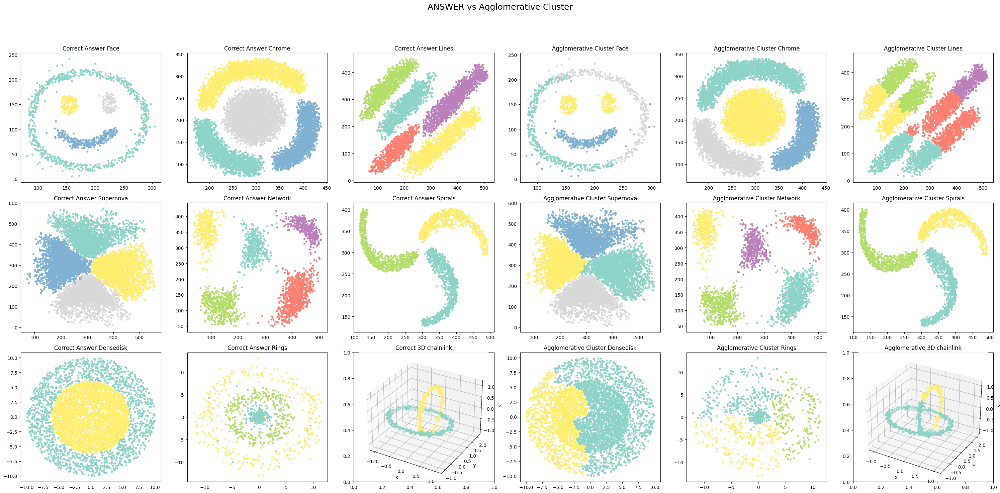

In [171]:
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(30, 15))
fig.suptitle('ANSWER vs Agglomerative Cluster\n', size = 18)

axes[0, 0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
axes[0, 0].set_title("Correct Answer Face")
axes[0, 3].scatter(df_face_AgglomerativeC['x'], df_face_AgglomerativeC['y'], c=df_face_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[0, 3].set_title("Agglomerative Cluster Face")

axes[0, 1].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
axes[0, 1].set_title("Correct Answer Chrome")
axes[0, 4].scatter(df_chrome_AgglomerativeC['x'], df_chrome_AgglomerativeC['y'], c=df_chrome_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[0, 4].set_title("Agglomerative Cluster Chrome")

axes[0, 2].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
axes[0, 2].set_title("Correct Answer Lines")
axes[0, 5].scatter(df_lines2_AgglomerativeC['x'], df_lines2_AgglomerativeC['y'], c=df_lines2_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[0, 5].set_title("Agglomerative Cluster Lines")

axes[1, 0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
axes[1, 0].set_title("Correct Answer Supernova")
axes[1, 3].scatter(df_supernova_AgglomerativeC['x'], df_supernova_AgglomerativeC['y'], c=df_supernova_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[1, 3].set_title("Agglomerative Cluster Supernova")

axes[1, 1].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
axes[1, 1].set_title("Correct Answer Network")
axes[1, 4].scatter(df_network_AgglomerativeC['x'], df_network_AgglomerativeC['y'], c=df_network_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[1, 4].set_title("Agglomerative Cluster Network")

axes[1, 2].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
axes[1, 2].set_title("Correct Answer Spirals")
axes[1, 5].scatter(df_spirals_AgglomerativeC['x'], df_spirals_AgglomerativeC['y'], c=df_spirals_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[1, 5].set_title("Agglomerative Cluster Spirals")

axes[2, 0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3")
axes[2, 0].set_title("Correct Answer Densedisk")
axes[2, 3].scatter(df_densedisk_AgglomerativeC['x'], df_densedisk_AgglomerativeC['y'], c=df_densedisk_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[2, 3].set_title("Agglomerative Cluster Densedisk")

axes[2, 1].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
axes[2, 1].set_title("Correct Answer Rings")
axes[2, 4].scatter(df_rings_AgglomerativeC['x'], df_rings_AgglomerativeC['y'], c=df_rings_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[2, 4].set_title("Agglomerative Cluster Rings")

ax3d = fig.add_subplot(3, 6, 15, projection='3d')
ax3d.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], cmap="Set3", s=10)
ax3d.set_title("Correct 3D chainlink")
ax3d.set_xlabel("X")
ax3d.set_ylabel("Y")
ax3d.set_zlabel("Z")

ax3d = fig.add_subplot(3, 6, 18, projection='3d')
ax3d.scatter(df_chainlink_AgglomerativeC['x'], df_chainlink_AgglomerativeC['y'], df_chainlink_AgglomerativeC['z'], c=df_chainlink_AgglomerativeC['Cluster'], cmap="Set3", s=10)
ax3d.set_title("Agglomerative 3D chainlink")
ax3d.set_xlabel("X")
ax3d.set_ylabel("Y")
ax3d.set_zlabel("Z")

plt.tight_layout(rect=[0, 0, 1, 0.95])


**C. Use DBSCAN to cluster each dataset**

1. Create each copy of the dataset for Agglomerative Clustering


In [194]:
df_face_DBSCAN = face_df.copy()
df_chrome_DBSCAN = chrome_df.copy()
df_lines2_DBSCAN = lines2_df.copy()
df_supernova_DBSCAN = supernova_df.copy()
df_network_DBSCAN = network_df.copy()
df_spirals_DBSCAN = spirals_df.copy()
df_densedisk_DBSCAN = densedisk_df.copy()
df_rings_DBSCAN = rings_df.copy()
df_chainlink_DBSCAN = chainlink_df.copy()

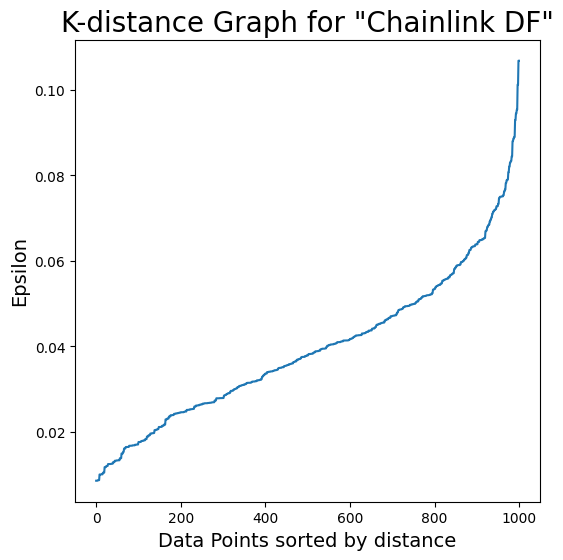

In [195]:
from sklearn.neighbors import NearestNeighbors
nn = NearestNeighbors(n_neighbors=4)
nbrs = nn.fit(df_chainlink_DBSCAN)
distances, indices = nbrs.kneighbors(df_chainlink_DBSCAN)

# Plotting K-distance Graph
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(6,6))
plt.plot(distances)
plt.title('K-distance Graph for "Chainlink DF"',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

2. Drop the "color" column on all datasets

In [196]:
df_face_DBSCAN.drop(columns=['color'], axis=1, inplace=True)
df_chrome_DBSCAN.drop(columns=['color'], axis=1, inplace=True)
df_lines2_DBSCAN.drop(columns=['color'], axis=1, inplace=True)
df_supernova_DBSCAN.drop(columns=['color'], axis=1, inplace=True)
df_network_DBSCAN.drop(columns=['color'], axis=1, inplace=True)
df_spirals_DBSCAN.drop(columns=['color'], axis=1, inplace=True)
df_densedisk_DBSCAN.drop(columns=['color'], axis=1, inplace=True)
df_rings_DBSCAN.drop(columns=['color'], axis=1, inplace=True)
df_chainlink_DBSCAN.drop(columns=['color'], axis=1, inplace=True)

3. Train a DBSCAN Clustering model for each dataset.

In [395]:
DBSCAN_face = DBSCAN(eps=40, min_samples=45, metric='euclidean')
DBSCAN_chrome = DBSCAN(eps=8, min_samples=4, metric='euclidean')
DBSCAN_lines2 = DBSCAN(eps=15, min_samples=13, metric='euclidean')
DBSCAN_supernova = DBSCAN(eps=10, min_samples=34, metric='euclidean')
DBSCAN_network = DBSCAN(eps=35.9, min_samples=19, metric='euclidean')
DBSCAN_spirals = DBSCAN(eps=16, min_samples=18, metric='euclidean')
DBSCAN_densedisk = DBSCAN(eps=0.401626443465657, min_samples=12, metric='euclidean')
DBSCAN_rings = DBSCAN(eps=1.8, min_samples=10, metric='euclidean')
DBSCAN_chainlink = DBSCAN(eps=0.5, min_samples=2, metric='euclidean')

y_DBSCAN_face = DBSCAN_face.fit_predict(df_face_DBSCAN)
y_DBSCAN_chrome = DBSCAN_chrome.fit_predict(df_chrome_DBSCAN)
y_DBSCAN_lines2 = DBSCAN_lines2.fit_predict(df_lines2_DBSCAN)
y_DBSCAN_supernova = DBSCAN_supernova.fit_predict(df_supernova_DBSCAN)
y_DBSCAN_network = DBSCAN_network.fit_predict(df_network_DBSCAN)
y_DBSCAN_spirals = DBSCAN_spirals.fit_predict(df_spirals_DBSCAN)
y_DBSCAN_densedisk = DBSCAN_densedisk.fit_predict(df_densedisk_DBSCAN)
y_DBSCAN_rings = DBSCAN_rings.fit_predict(df_rings_DBSCAN)
y_DBSCAN_chainlink = DBSCAN_chainlink.fit_predict(df_chainlink_DBSCAN)

4. Add a "Cluster" column for each data set

In [396]:
df_face_DBSCAN['Cluster'] = y_DBSCAN_face
df_chrome_DBSCAN['Cluster'] = y_DBSCAN_chrome
df_lines2_DBSCAN['Cluster'] = y_DBSCAN_lines2
df_supernova_DBSCAN['Cluster'] = y_DBSCAN_supernova
df_network_DBSCAN['Cluster'] = y_DBSCAN_network
df_spirals_DBSCAN['Cluster'] = y_DBSCAN_spirals
df_densedisk_DBSCAN['Cluster'] = y_DBSCAN_densedisk
df_rings_DBSCAN['Cluster'] = y_DBSCAN_rings
df_chainlink_DBSCAN['Cluster'] = y_DBSCAN_chainlink

5. Plot the Correct cluster and the DBSCAN cluster

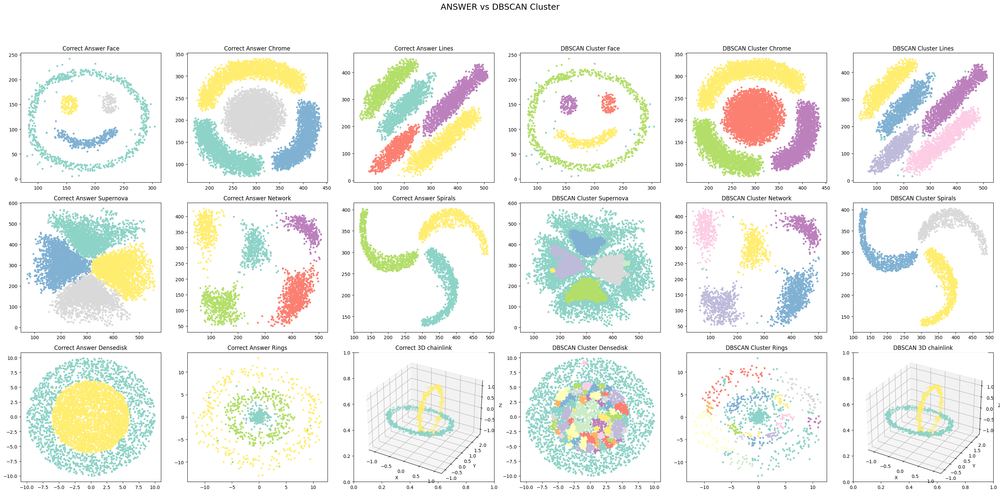

In [397]:
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(30, 15))
fig.suptitle('ANSWER vs DBSCAN Cluster\n', size = 18)

axes[0, 0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
axes[0, 0].set_title("Correct Answer Face")
axes[0, 3].scatter(df_face_DBSCAN['x'], df_face_DBSCAN['y'], c=df_face_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[0, 3].set_title("DBSCAN Cluster Face")

axes[0, 1].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
axes[0, 1].set_title("Correct Answer Chrome")
axes[0, 4].scatter(df_chrome_DBSCAN['x'], df_chrome_DBSCAN['y'], c=df_chrome_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[0, 4].set_title("DBSCAN Cluster Chrome")

axes[0, 2].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
axes[0, 2].set_title("Correct Answer Lines")
axes[0, 5].scatter(df_lines2_DBSCAN['x'], df_lines2_DBSCAN['y'], c=df_lines2_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[0, 5].set_title("DBSCAN Cluster Lines")

axes[1, 0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
axes[1, 0].set_title("Correct Answer Supernova")
axes[1, 3].scatter(df_supernova_DBSCAN['x'], df_supernova_DBSCAN['y'], c=df_supernova_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[1, 3].set_title("DBSCAN Cluster Supernova")

axes[1, 1].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
axes[1, 1].set_title("Correct Answer Network")
axes[1, 4].scatter(df_network_DBSCAN['x'], df_network_DBSCAN['y'], c=df_network_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[1, 4].set_title("DBSCAN Cluster Network")

axes[1, 2].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
axes[1, 2].set_title("Correct Answer Spirals")
axes[1, 5].scatter(df_spirals_DBSCAN['x'], df_spirals_DBSCAN['y'], c=df_spirals_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[1, 5].set_title("DBSCAN Cluster Spirals")

axes[2, 0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3")
axes[2, 0].set_title("Correct Answer Densedisk")
axes[2, 3].scatter(df_densedisk_DBSCAN['x'], df_densedisk_DBSCAN['y'], c=df_densedisk_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[2, 3].set_title("DBSCAN Cluster Densedisk")

axes[2, 1].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
axes[2, 1].set_title("Correct Answer Rings")
axes[2, 4].scatter(df_rings_DBSCAN['x'], df_rings_DBSCAN['y'], c=df_rings_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[2, 4].set_title("DBSCAN Cluster Rings")

ax3d = fig.add_subplot(3, 6, 15, projection='3d')
ax3d.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], cmap="Set3", s=10)
ax3d.set_title("Correct 3D chainlink")
ax3d.set_xlabel("X")
ax3d.set_ylabel("Y")
ax3d.set_zlabel("Z")

ax3d = fig.add_subplot(3, 6, 18, projection='3d')
ax3d.scatter(df_chainlink_DBSCAN['x'], df_chainlink_DBSCAN['y'], df_chainlink_DBSCAN['z'], c=df_chainlink_DBSCAN['Cluster'], cmap="Set3", s=10)
ax3d.set_title("DBSCAN 3D chainlink")
ax3d.set_xlabel("X")
ax3d.set_ylabel("Y")
ax3d.set_zlabel("Z")

plt.tight_layout(rect=[0, 0, 1, 0.95])

**D. Compare all algorithms**

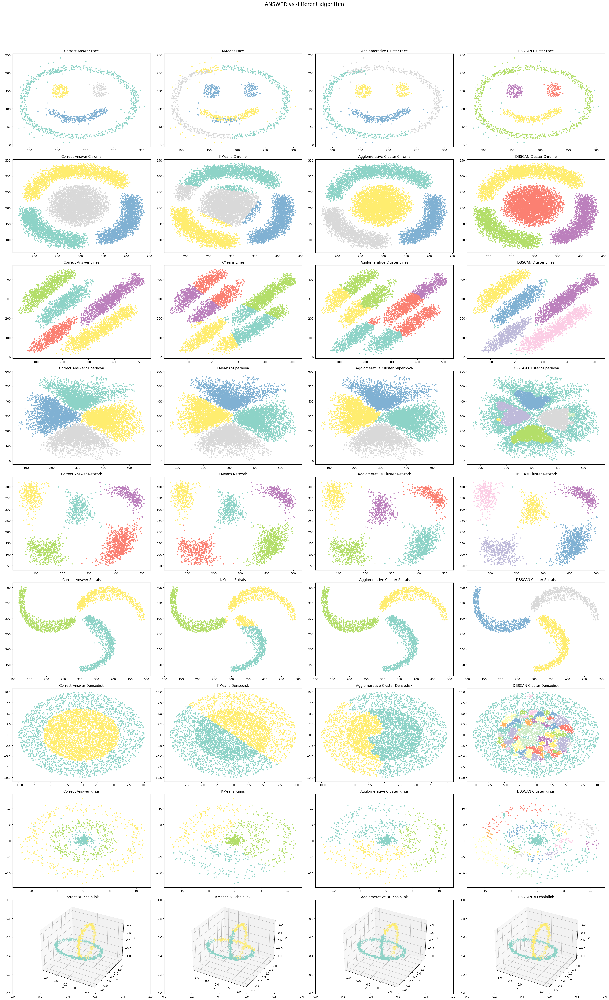

In [411]:
fig, axes = plt.subplots(nrows=9, ncols=4,figsize=(30,50))
fig.suptitle('ANSWER vs different algorithm\n', size = 18)

axes[0, 0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
axes[0, 0].set_title("Correct Answer Face")
axes[0, 1].scatter(df_face['x'], df_face['y'], c=df_face['Cluster'], s=10, cmap="Set3")
axes[0, 1].set_title("KMeans Face")
axes[0, 2].scatter(df_face_AgglomerativeC['x'], df_face_AgglomerativeC['y'], c=df_face_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[0, 2].set_title("Agglomerative Cluster Face")
axes[0, 3].scatter(df_face_DBSCAN['x'], df_face_DBSCAN['y'], c=df_face_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[0, 3].set_title("DBSCAN Cluster Face")

axes[1, 0].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
axes[1, 0].set_title("Correct Answer Chrome")
axes[1, 1].scatter(df_chrome['x'], df_chrome['y'], c=df_chrome['Cluster'], s=10, cmap="Set3")
axes[1, 1].set_title("KMeans Chrome")
axes[1, 2].scatter(df_chrome_AgglomerativeC['x'], df_chrome_AgglomerativeC['y'], c=df_chrome_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[1, 2].set_title("Agglomerative Cluster Chrome")
axes[1, 3].scatter(df_chrome_DBSCAN['x'], df_chrome_DBSCAN['y'], c=df_chrome_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[1, 3].set_title("DBSCAN Cluster Chrome")

axes[2, 0].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
axes[2, 0].set_title("Correct Answer Lines")
axes[2, 1].scatter(df_lines2['x'], df_lines2['y'], c=df_lines2['Cluster'], s=10, cmap="Set3")
axes[2, 1].set_title("KMeans Lines")
axes[2, 2].scatter(df_lines2_AgglomerativeC['x'], df_lines2_AgglomerativeC['y'], c=df_lines2_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[2, 2].set_title("Agglomerative Cluster Lines")
axes[2, 3].scatter(df_lines2_DBSCAN['x'], df_lines2_DBSCAN['y'], c=df_lines2_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[2, 3].set_title("DBSCAN Cluster Lines")

axes[3, 0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
axes[3, 0].set_title("Correct Answer Supernova")
axes[3, 1].scatter(df_supernova['x'], df_supernova['y'], c=df_supernova['Cluster'], s=10, cmap="Set3")
axes[3, 1].set_title("KMeans Supernova")
axes[3, 2].scatter(df_supernova_AgglomerativeC['x'], df_supernova_AgglomerativeC['y'], c=df_supernova_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[3, 2].set_title("Agglomerative Cluster Supernova")
axes[3, 3].scatter(df_supernova_DBSCAN['x'], df_supernova_DBSCAN['y'], c=df_supernova_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[3, 3].set_title("DBSCAN Cluster Supernova")

axes[4, 0].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
axes[4, 0].set_title("Correct Answer Network")
axes[4, 1].scatter(df_network['x'], df_network['y'], c=df_network['Cluster'], s=10, cmap="Set3")
axes[4, 1].set_title("KMeans Network")
axes[4, 2].scatter(df_network_AgglomerativeC['x'], df_network_AgglomerativeC['y'], c=df_network_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[4, 2].set_title("Agglomerative Cluster Network")
axes[4, 3].scatter(df_network_DBSCAN['x'], df_network_DBSCAN['y'], c=df_network_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[4, 3].set_title("DBSCAN Cluster Network")

axes[5, 0].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
axes[5, 0].set_title("Correct Answer Spirals")
axes[5, 1].scatter(df_spirals['x'], df_spirals['y'], c=df_spirals['Cluster'], s=10, cmap="Set3")
axes[5, 1].set_title("KMeans Spirals")
axes[5, 2].scatter(df_spirals_AgglomerativeC['x'], df_spirals_AgglomerativeC['y'], c=df_spirals_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[5, 2].set_title("Agglomerative Cluster Spirals")
axes[5, 3].scatter(df_spirals_DBSCAN['x'], df_spirals_DBSCAN['y'], c=df_spirals_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[5, 3].set_title("DBSCAN Cluster Spirals")

axes[6, 0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3")
axes[6, 0].set_title("Correct Answer Densedisk")
axes[6, 1].scatter(df_densedisk['x'], df_densedisk['y'], c=df_densedisk['Cluster'], s=10, cmap="Set3")
axes[6, 1].set_title("KMeans Densedisk")
axes[6, 2].scatter(df_densedisk_AgglomerativeC['x'], df_densedisk_AgglomerativeC['y'], c=df_densedisk_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[6, 2].set_title("Agglomerative Cluster Densedisk")
axes[6, 3].scatter(df_densedisk_DBSCAN['x'], df_densedisk_DBSCAN['y'], c=df_densedisk_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[6, 3].set_title("DBSCAN Cluster Densedisk")

axes[7, 0].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
axes[7, 0].set_title("Correct Answer Rings")
axes[7, 1].scatter(df_rings['x'], df_rings['y'], c=df_rings['Cluster'], s=10, cmap="Set3")
axes[7, 1].set_title("KMeans Rings")
axes[7, 2].scatter(df_rings_AgglomerativeC['x'], df_rings_AgglomerativeC['y'], c=df_rings_AgglomerativeC['Cluster'], s=10, cmap="Set3")
axes[7, 2].set_title("Agglomerative Cluster Rings")
axes[7, 3].scatter(df_rings_DBSCAN['x'], df_rings_DBSCAN['y'], c=df_rings_DBSCAN['Cluster'], s=10, cmap="Set3")
axes[7, 3].set_title("DBSCAN Cluster Rings")

ax3d_1 = fig.add_subplot(9, 4, 33, projection='3d')  # 9th row, 1st column (index 8,0)
ax3d_1.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], cmap="Set3", s=10)
ax3d_1.set_title("Correct 3D chainlink")
ax3d_1.set_xlabel("X")
ax3d_1.set_ylabel("Y")
ax3d_1.set_zlabel("Z")

ax3d_2 = fig.add_subplot(9, 4, 34, projection='3d')  # 9th row, 2nd column (index 8,1)
ax3d_2.scatter(df_chainlink['x'], df_chainlink['y'], df_chainlink['z'], c=df_chainlink['Cluster'], cmap="Set3", s=10)
ax3d_2.set_title("KMeans 3D chainlink")
ax3d_2.set_xlabel("X")
ax3d_2.set_ylabel("Y")
ax3d_2.set_zlabel("Z")

ax3d_3 = fig.add_subplot(9, 4, 35, projection='3d')  # 9th row, 3rd column (index 8,2)
ax3d_3.scatter(df_chainlink_AgglomerativeC['x'], df_chainlink_AgglomerativeC['y'], df_chainlink_AgglomerativeC['z'], c=df_chainlink_AgglomerativeC['Cluster'], cmap="Set3", s=10)
ax3d_3.set_title("Agglomerative 3D chainlink")
ax3d_3.set_xlabel("X")
ax3d_3.set_ylabel("Y")
ax3d_3.set_zlabel("Z")

ax3d_4 = fig.add_subplot(9, 4, 36, projection='3d')  # 9th row, 4th column (index 8,3)
ax3d_4.scatter(df_chainlink_DBSCAN['x'], df_chainlink_DBSCAN['y'], df_chainlink_DBSCAN['z'], c=df_chainlink_DBSCAN['Cluster'], cmap="Set3", s=10)
ax3d_4.set_title("DBSCAN 3D chainlink")
ax3d_4.set_xlabel("X")
ax3d_4.set_ylabel("Y")
ax3d_4.set_zlabel("Z")

plt.tight_layout(rect=[0, 0, 1, 0.95])